# Sparse Vs. Dense Optical Flow – Intro Workshop

In this project, we're going to explore 2 techniques to solve tracking problem:
*   Sparse Optical Flow
*   Dense Optical Flow

Sparse Optical Flow:

    Computes motion vectors for specific feature points in an image.
    Focuses on tracking motion in selected key points or regions.
    Requires less computational power but may miss subtle motions in between tracked points.

Dense Optical Flow:

    Computes motion vectors for every pixel in an image.
    Captures motion information for the entire image.
    Provides a more detailed representation of motion but requires more computational resources.

## Imports and Colab

In [3]:
# Grab the data for feature tracking experiment
!wget -qq https://optical-flow-data.s3.eu-west-3.amazonaws.com/images.zip
# unzip the Image Folder and remove images.zip folder
!unzip -qq images.zip && rm images.zip
# make output directory for storing the results
!mkdir output
# check all the files and directories
!ls

images	output	sample_data


In [ ]:
# Download the Video
!pip install pytube
from pytube import YouTube
url = "https://www.youtube.com/watch?v=MNn9qKG2UFI&list=PLcQZGj9lFR7y5WikozDSrdk6UCtAnM9mB"
yt = YouTube(url)
stream = yt.streams.get_highest_resolution()
stream.download(output_path="/content/output")

ERROR: Operation cancelled by user


'/content/output/4K Road traffic video for object detection and tracking - free download now!.mp4'

In [ ]:
import os

# Define the current and new file names
current_filename = "/content/output/4K Road traffic video for object detection and tracking - free download now!.mp4"
new_filename = "/content/output/VIDEO.mp4"

# Rename the file
os.rename(current_filename, new_filename)

# Verify the file has been renamed
if os.path.exists(new_filename):
    print(f"File renamed to {new_filename}")
else:
    print("File renaming failed")

File renamed to /content/output/VIDEO.mp4


In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pickle
from google.colab.patches import cv2_imshow

# Sparse Optical Flow

This technique is about calculating Optical Flow only for specific features, and not for every pixel. It's **faster** but **not very accurate**.<p>

The algorithm we'll use for Feature Detection is the **Shi-Tomasi** detector, and the one we'll use for Optical Flow is called **Lucas-Kanade**.<p>

### First, let's calculate the Sparse Optical Flow on two consecutive images

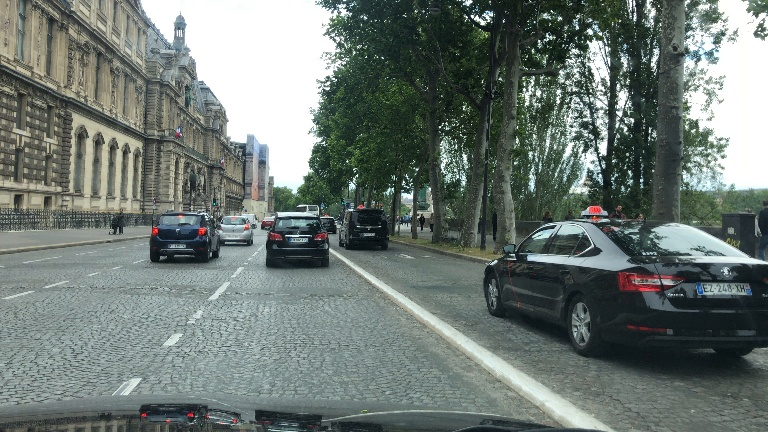

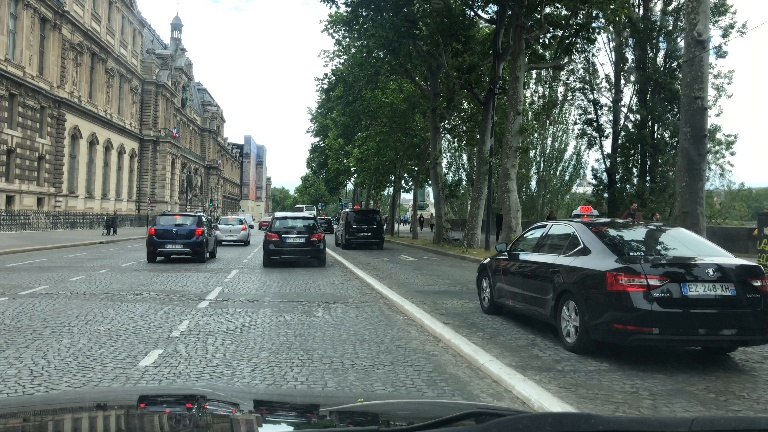

In [ ]:
#Load two consecutive images
im1 = cv2.imread("images/image0.jpg")
im2 = cv2.imread("images/image1.jpg")
# show two consecutive images
cv2_imshow(im1)
cv2_imshow(im2)

In [ ]:
#Create an Empty mask and define the color of output to green
mask = np.zeros_like(im1)
color = (0, 255, 0)

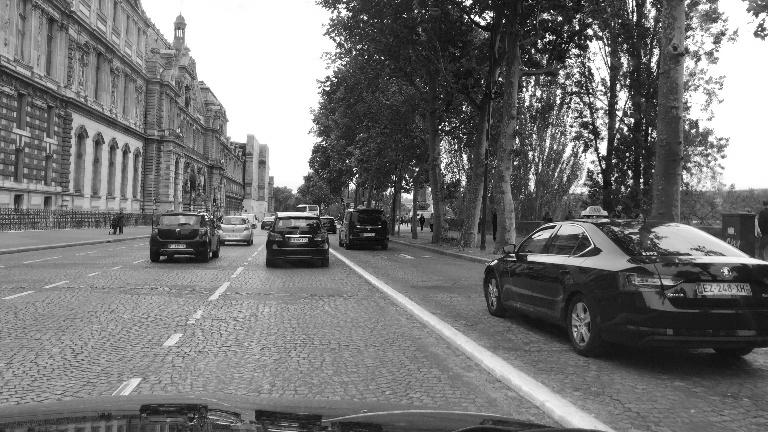

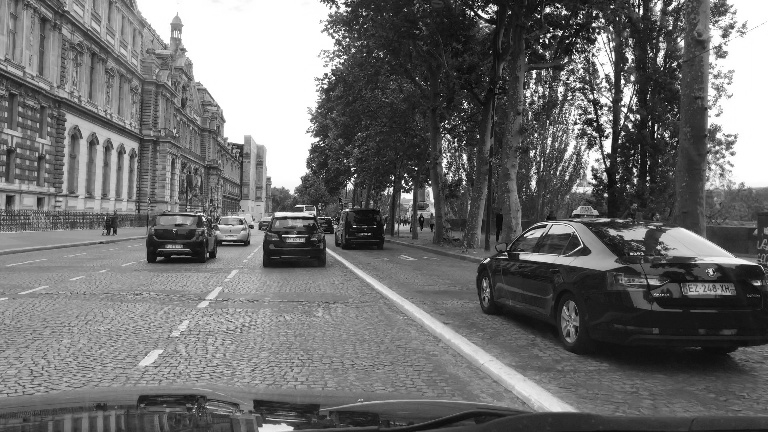

In [ ]:
#Convert both images to grayscale
gray1 = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY)
# show gray scale grayscale images
cv2_imshow(gray1)
cv2_imshow(gray2)

Defining the parameters and launch the **Shi-Tomasi corner detector** on the first image. According to OpenCV: "As usual, image should be a **grayscale image**.

Specifying **number of corners you want to find**. Then you specify the **quality level**, which is a value between 0-1, which denotes the **minimum quality of corner below which everyone is rejected**. Then we provide the **minimum euclidean distance between corners detected**." <p> 👉To understand how to define the parameters, you can use [this link](https://docs.opencv.org/master/dd/d1a/group__imgproc__feature.html#ga1d6bb77486c8f92d79c8793ad995d541).

In [ ]:
feature_params = dict(maxCorners = 300, qualityLevel = 0.0025, minDistance = 15, blockSize = 2) # Default 300, 0.25, 3, 7
prev = cv2.goodFeaturesToTrack(gray1, mask = None, **feature_params)

In [ ]:
print(feature_params)
print(prev[0])

{'maxCorners': 300, 'qualityLevel': 0.0025, 'minDistance': 15, 'blockSize': 2}
[[477.  16.]]


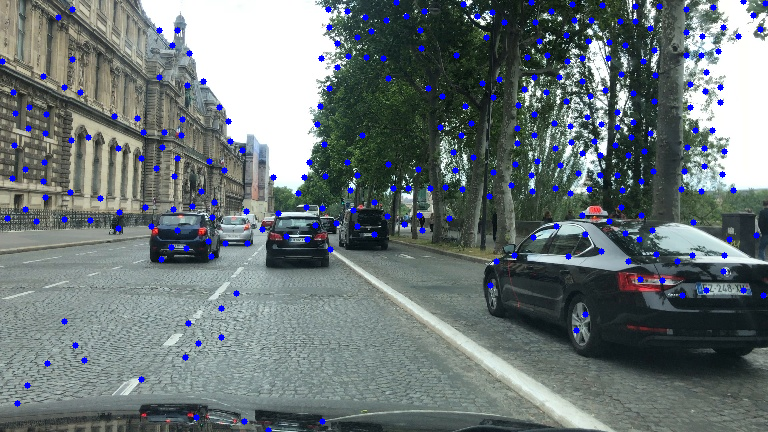

In [ ]:
#Go through each detected corner, and draw a dot
image_corners = im1.copy()

for i in prev:
    x,y = i.ravel()
    cv2.circle(image_corners,(int(x),int(y)),3,255,-1)
cv2_imshow(image_corners)

Launch the Lucas Kanade Optical Flow algorithm with the features and both grayscale images.<p>
👉 [Here's the link](https://docs.opencv.org/3.4/dc/d6b/group__video__track.html#ga473e4b886d0bcc6b65831eb88ed93323) to understand the parameters better.

In [ ]:
lk_params = dict(winSize = (15,15), maxLevel = 2, criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))
next, status, error = cv2.calcOpticalFlowPyrLK(gray1, gray2, prev, None, **lk_params)

In [ ]:
print(lk_params)
idx = 19
print(prev[idx])
print(next[idx])
print(status[idx])
print(error[idx])

{'winSize': (15, 15), 'maxLevel': 2, 'criteria': (3, 10, 0.03)}
[[659.   6.]]
[[666.6108    -9.550047]]
[0]
[0.]


In [ ]:
#Store the Matches (status=1 means a match)
good_old = prev[status == 1]
good_new = next[status == 1]

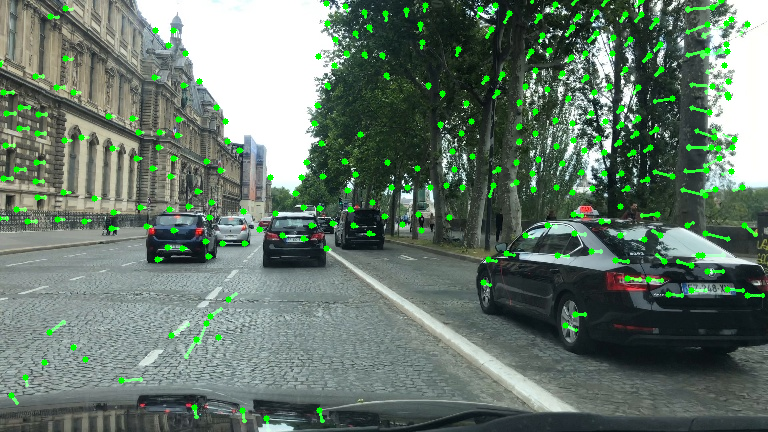

In [ ]:
#Go through each matched feature, and draw it on the second image

for new, old in zip(good_new, good_old):
    a, b = new.ravel()
    c, d = old.ravel()
    mask = cv2.arrowedLine(mask, (int(a), int(b)), (int(c), int(d)), color, 2)
    im2 = cv2.circle(im2, (int(a), int(b)), 3, color, -1)
# Overlays the optical flow tracks on the original frame
output = cv2.add(im2, mask)
# Updates previous frame
gray1 = gray2.copy()
# Updates previous good feature points
prev = good_new.reshape(-1, 1, 2)

#cv2.imwrite("output.jpg", output)
cv2_imshow(output)

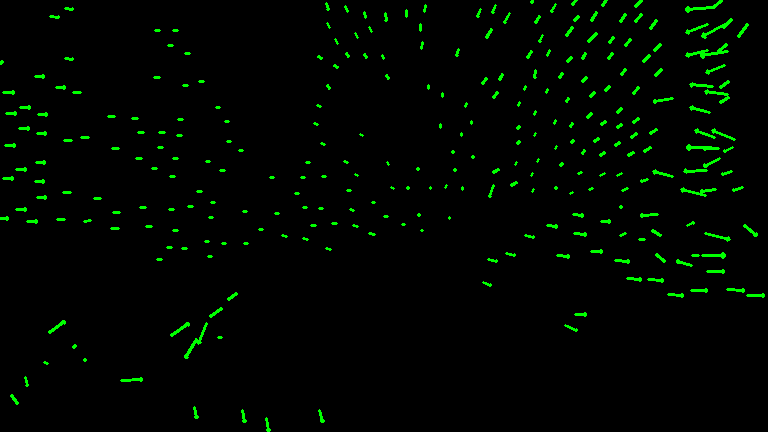

In [ ]:
cv2_imshow(mask)

### On a video

In [ ]:
def lk_from_image(image):
    global idx, gray1, mask, prev
    if idx==0:
        gray1 = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        feature_params = dict(maxCorners = 600, qualityLevel = 0.0025, minDistance = 15, blockSize = 2)
        prev = cv2.goodFeaturesToTrack(gray1, mask = None, **feature_params)
        mask = np.zeros_like(image)
        idx+=1
        return image
    # Else
    im2 = image
    if idx%15==0:
        mask = np.zeros_like(image)

    if idx%5==0:
        # Every 5 images, relaunch the feature detection
        feature_params = dict(maxCorners = 300, qualityLevel = 0.2, minDistance = 2, blockSize = 7)
        prev = cv2.goodFeaturesToTrack(gray1, mask = None, **feature_params)

    color = (0, 255, 0)
    gray2 = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY)

    lk_params = dict(winSize = (15,15), maxLevel = 2, criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))
    next, status, error = cv2.calcOpticalFlowPyrLK(gray1, gray2, prev, None, **lk_params)

    good_old = prev[status == 1]
    good_new = next[status == 1]

    for new, old in zip(good_new, good_old):
        a, b = new.ravel()
        c, d = old.ravel()
        mask = cv2.arrowedLine(mask, (int(a), int(b)), (int(c), int(d)), color, 2)
        im2 = cv2.circle(im2, (int(a), int(b)), 3, color, -1)
    output = cv2.add(im2, mask)
    gray1 = gray2.copy()
    prev = good_new.reshape(-1, 1, 2)
    idx += 1
    return output

In [ ]:
from moviepy.editor import VideoFileClip
idx = 0

video_file = "/content/output/VIDEO.mp4"
clip = VideoFileClip(video_file).subclip(0,20)
white_clip = clip.fl_image(lk_from_image)
%time white_clip.write_videofile("/content/output/Sparse_Output.mp4",audio=False)

Moviepy - Building video /content/output/Sparse_Output.mp4.
Moviepy - Writing video /content/output/Sparse_Output.mp4



Moviepy - Done !
Moviepy - video ready /content/output/Sparse_Output.mp4
CPU times: user 14.8 s, sys: 1.98 s, total: 16.7 s
Wall time: 55.4 s


In [ ]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('/content/output/Sparse_Output.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=800 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

# Dense Optical Flow

In this second part, we'll try to learn about Dense Optical Flow; which is used when **we're tracking every pixel of an image**. It's **longer** but **works much better**.

### Let's do the Dense Optical Flow on two consecutive images

In [ ]:
#Load the 2 consecutive images and convert them to grayscale
im1 = cv2.imread("images/image0.jpg")
im2 = cv2.imread("images/image1.jpg")
gray1 = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY)

In [ ]:
#Create a mask in HSV Color Space.
hsv = np.zeros_like(im1)
# Sets image saturation to maximum.
hsv[..., 1] = 255

Now comes the Optical Flow Algorithm. This time, we'll use the Farneback algorithm (2003).<p>
Unlike the Lucas Kanade method, we don't want to find "next, status, and error". This time, we just want to estimate one output, the **flow**.

If you'd like to understand how to tweak the parameters, you can [visit this link](https://docs.opencv.org/3.0-beta/modules/video/doc/motion_analysis_and_object_tracking.html#calcopticalflowfarneback). <p>

👉 The next step is to calculate this flow, and convert it into a visual output.

In [ ]:
flow = cv2.calcOpticalFlowFarneback(gray1, gray2, None, 0.5, 3, 15, 3, 5, 1.2, 0)

### But what is the Flow?
**The Flow is a 2D Matrix** that has the same size as our input frame (image 1). In this matrix, we have the **optical flow vectors U and V**. These are made of point coordinates. **For any point P (x,y) in the grayscale image, the flow contains the corresponding (delta_x, delta_y)** --- how much did that pixel move in the X and Y direction.<p>

In [ ]:
print("Shapes Gray & Flow")
print(gray1.shape)
print(flow.shape)
print(" ")

print("Flow Output")
print(flow)
print(" ")

print("U Vector")
print(flow[...,0])
print(" ")

print("V Vector")
print(flow[...,1])
print(" ")

Shapes Gray & Flow
(432, 768)
(432, 768, 2)
 
Flow Output
[[[-8.606705   -0.46653652]
  [-8.967901   -0.5036245 ]
  [-9.011185   -0.5011998 ]
  ...
  [23.189276   -8.995762  ]
  [23.200577   -9.006791  ]
  [22.84172    -9.010163  ]]

 [[-8.669753   -0.6251331 ]
  [-8.971131   -0.624706  ]
  [-9.027629   -0.61310124]
  ...
  [23.269274   -8.964831  ]
  [23.309032   -8.968984  ]
  [23.059587   -8.960802  ]]

 [[-8.697428   -0.649018  ]
  [-8.95854    -0.64226425]
  [-9.0307255  -0.6300936 ]
  ...
  [23.46124    -8.884274  ]
  [23.560646   -8.883723  ]
  [23.502108   -8.867053  ]]

 ...

 [[ 4.4493804  -6.9319096 ]
  [ 5.515306   -7.9730816 ]
  [ 6.740018   -8.880184  ]
  ...
  [-8.005964   -2.4440458 ]
  [-5.9824815  -1.8417977 ]
  [-4.240536   -1.2768935 ]]

 [[ 4.2441535  -6.651492  ]
  [ 5.438955   -7.7849603 ]
  [ 6.6974072  -8.714903  ]
  ...
  [-7.782724   -2.3513496 ]
  [-5.68055    -1.7401717 ]
  [-3.9246738  -1.1770893 ]]

 [[ 3.5780997  -5.795508  ]
  [ 4.8877645  -7.0012627 ]


**We have 2 vectors U and V**, which correspond to the first and second column of the flow output in cartesian coordinates.<p>

---

👉 According to OpenCV: "We get **a 2-channel array** with **optical flow vectors, (u,v)**. We find their **magnitude** and **direction**. We color code the result for better visualization. **Direction corresponds to Hue** value of the image. **Magnitude corresponds to Value plane**."<p>

---

👉 In other words, it's possible to make something with "the point moved 2 pixels to the right"! We find the Magnitude and Angle, convert that to HSV Space (Hue, Saturation, Value) and then make it an image.

I know this sounds horrible, but we need to go back to High School Maths (or maybe college), and remember about Vectors in Cartesian and Polar coordinates. Of course, **the vectors represent the displacements of each pixels.**

*   A vector in **cartesian** coordinates has its values in **(x,y)**.
*   A vector in **polar** coordinates has its values in **Radian**.
![](https://cdn.kastatic.org/ka-perseus-images/1559d8785a298fdd0bac0443388b3812c4327ec3.png)

<p> To compute the Polar coordinates, we must calculate the magnitude and the angle of the vector.

In [ ]:
# Computes the magnitude and angle of the 2D vectors
magnitude, angle = cv2.cartToPolar(flow[..., 0], flow[..., 1])

print(magnitude)
print(angle)

[[ 8.61934    8.982032   9.025113  ... 24.873003  24.887527  24.554577 ]
 [ 8.692262   8.992856   9.048424  ... 24.936466  24.97506   24.739452 ]
 [ 8.721609   8.981533   9.05268   ... 25.087051  25.179846  25.119188 ]
 ...
 [ 8.237012   9.694774  11.148341  ...  8.370712   6.259577   4.428612 ]
 [ 7.8901954  9.496728  10.991123  ...  8.130169   5.941115   4.0973897]
 [ 6.8110733  8.538613  10.181647  ...  6.552034   4.4436617  2.822607 ]]
[[3.1957355 3.1976817 3.1971445 ... 5.9130516 5.912803  5.9073853]
 [3.2135606 3.2111032 3.2093904 ... 5.9153686 5.915786  5.912473 ]
 [3.2160637 3.2131507 3.2112396 ... 5.921117  5.922536  5.922334 ]
 ...
 [5.2829237 5.317422  5.361523  ... 3.4379382 3.4403043 3.4341247]
 [5.2802353 5.3220787 5.367537  ... 3.4350493 3.4389086 3.4330275]
 [5.2654166 5.3217273 5.376289  ... 3.4252064 3.4279673 3.421077 ]]


In [ ]:
# Sets image hue according to the optical flow direction
hsv[..., 0] = angle * 180 / np.pi / 2

print(hsv)

[[[ 91 255   0]
  [ 91 255   0]
  [ 91 255   0]
  ...
  [169 255   0]
  [169 255   0]
  [169 255   0]]

 [[ 92 255   0]
  [ 91 255   0]
  [ 91 255   0]
  ...
  [169 255   0]
  [169 255   0]
  [169 255   0]]

 [[ 92 255   0]
  [ 92 255   0]
  [ 91 255   0]
  ...
  [169 255   0]
  [169 255   0]
  [169 255   0]]

 ...

 [[151 255   0]
  [152 255   0]
  [153 255   0]
  ...
  [ 98 255   0]
  [ 98 255   0]
  [ 98 255   0]]

 [[151 255   0]
  [152 255   0]
  [153 255   0]
  ...
  [ 98 255   0]
  [ 98 255   0]
  [ 98 255   0]]

 [[150 255   0]
  [152 255   0]
  [154 255   0]
  ...
  [ 98 255   0]
  [ 98 255   0]
  [ 98 255   0]]]


In [ ]:
# Sets image value according to the optical flow magnitude (normalized)
hsv[..., 2] = cv2.normalize(magnitude, None, 0, 255, cv2.NORM_MINMAX)
print(hsv)

[[[ 91 255  55]
  [ 91 255  57]
  [ 91 255  57]
  ...
  [169 255 159]
  [169 255 159]
  [169 255 157]]

 [[ 92 255  55]
  [ 91 255  57]
  [ 91 255  58]
  ...
  [169 255 160]
  [169 255 160]
  [169 255 158]]

 [[ 92 255  55]
  [ 92 255  57]
  [ 91 255  58]
  ...
  [169 255 161]
  [169 255 161]
  [169 255 161]]

 ...

 [[151 255  52]
  [152 255  62]
  [153 255  71]
  ...
  [ 98 255  53]
  [ 98 255  40]
  [ 98 255  28]]

 [[151 255  50]
  [152 255  60]
  [153 255  70]
  ...
  [ 98 255  52]
  [ 98 255  38]
  [ 98 255  26]]

 [[150 255  43]
  [152 255  54]
  [154 255  65]
  ...
  [ 98 255  42]
  [ 98 255  28]
  [ 98 255  18]]]


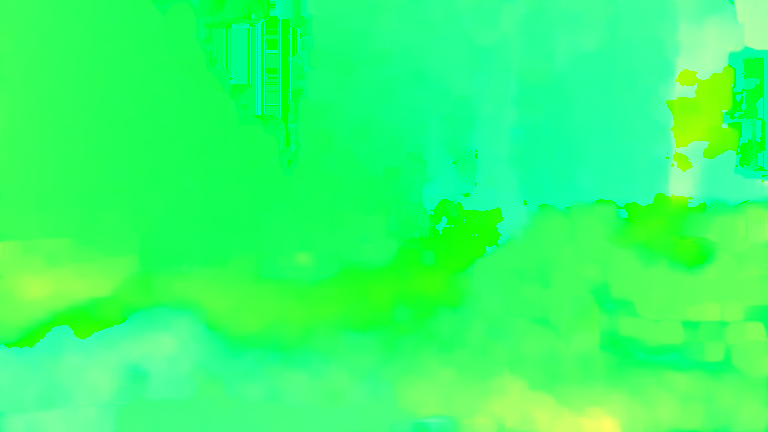

In [ ]:
cv2_imshow(hsv)

In [ ]:
# Converts HSV to RGB (BGR) color representation
rgb = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)

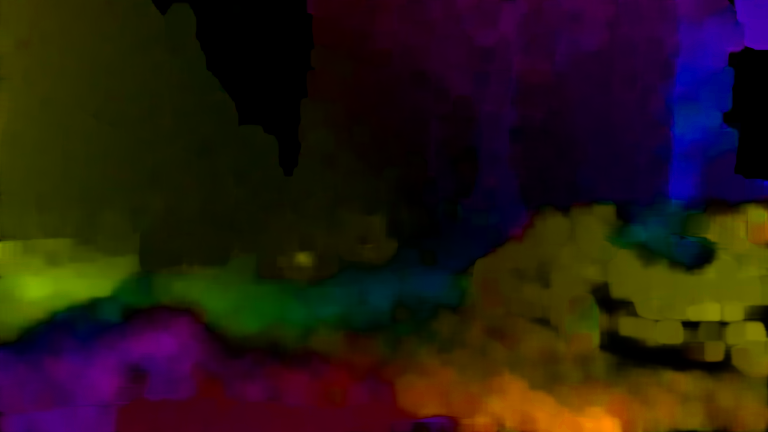

In [ ]:
#Display the Output
cv2.imwrite("output/Dense Output.jpg",rgb)
cv2_imshow(rgb)

![](https://www.researchgate.net/profile/Christophoros-Nikou/publication/266149545/figure/fig1/AS:392088710598656@1470492641144/The-optical-flow-field-color-coding-Smaller-vectors-are-lighter-and-color-represents-the.png)

### On a video

In [ ]:
def farneback_from_image(image):
    global idx, im1
    if idx==0:
        im1 = image
        idx+=1
        return im1
    else:
        im2 = image
        gray1 = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)
        gray2 = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY)
        hsv = np.zeros_like(im1)
        hsv[..., 1] = 255
        flow = cv2.calcOpticalFlowFarneback(gray1, gray2, None, 0.5, 3, 15, 3, 5, 1.2, 0)
        magnitude, angle = cv2.cartToPolar(flow[..., 0], flow[..., 1])
        hsv[..., 0] = angle * 180 / np.pi / 2
        hsv[..., 2] = cv2.normalize(magnitude, None, 0, 255, cv2.NORM_MINMAX)
        bgr = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)
        idx+=1
        im1= image.copy()
        return bgr

In [ ]:
from moviepy.editor import VideoFileClip
idx = 0

video_file = "/content/output/VIDEO.mp4"
clip = VideoFileClip(video_file).subclip(0,10)
white_clip = clip.fl_image(farneback_from_image)
%time white_clip.write_videofile("/content/output/Dense_Output.mp4",audio=False)

Moviepy - Building video /content/output/Dense_Output.mp4.
Moviepy - Writing video /content/output/Dense_Output.mp4



Moviepy - Done !
Moviepy - video ready /content/output/Dense_Output.mp4
CPU times: user 2min 7s, sys: 8.76 s, total: 2min 16s
Wall time: 2min 35s


In [ ]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('/content/output/Dense_Output.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=800 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)